# Import Library

In [ ]:
!python --version

Python 3.12.12


In [2]:
import os
import cv2
import numpy as np
from pathlib import Path
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from scipy.signal import convolve2d
import warnings
import joblib
import random

warnings.filterwarnings('ignore')

# Load Gambar

In [3]:
!unzip /content/drive/MyDrive/dataset.zip

Archive:  /content/drive/MyDrive/dataset.zip
   creating: dataset/
   creating: dataset/test/
   creating: dataset/train/
   creating: dataset/test/lampu-hijau/
   creating: dataset/test/lampu-kuning/
   creating: dataset/test/lampu-merah/
   creating: dataset/test/larangan-belok-kanan/
   creating: dataset/test/larangan-belok-kiri/
   creating: dataset/test/larangan-berhenti/
   creating: dataset/test/larangan-berjalan-terus-wajib-berhenti-sesaat/
   creating: dataset/test/larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor/
   creating: dataset/test/larangan-memutar-balik/
   creating: dataset/test/larangan-parkir/
   creating: dataset/test/peringatan-alat-pemberi-isyarat-lalu-lintas/
   creating: dataset/test/peringatan-banyak-pejalan-kaki-menggunakan-zebra-cross/
   creating: dataset/test/peringatan-penegasan-rambu-tambahan/
   creating: dataset/test/peringatan-pintu-perlintasan-kereta-api/
   creating: dataset/test/peringatan-simpang-tiga-sisi-kiri/
   creating: dataset/test

In [4]:
def load_dataset(img_dir):
    p = Path(img_dir)
    dirs = p.glob('*')
    img_list = []

    for dir_path in dirs:
        if not dir_path.is_dir():
            continue

        label = str(dir_path).split('/')[-1]

        for file in dir_path.glob('*.jpg'):
            try:
                img_bgr = cv2.imread(str(file))

                if img_bgr is not None:
                    img_list.append((img_bgr, label))

            except Exception as e:
                print(f"Error memuat file {file}: {e}")

    return img_list

In [5]:
train_dir = "/content/dataset/train/"
test_dir = "/content/dataset/test/"

print("Memuat dan memotong gambar training...")
train_img = load_dataset(train_dir)
print("Memuat dan memotong gambar testing...")
test_img = load_dataset(test_dir)

X_train_img = [item[0] for item in train_img]
y_train_str = [item[1] for item in train_img]
X_test_img = [item[0] for item in test_img]
y_test_str = [item[1] for item in test_img]

Memuat dan memotong gambar training...
Memuat dan memotong gambar testing...


# Pre-processing (HSV)

In [6]:
def hsv_preprocessing(img_list, class_list):
    hsv_img_list = []
    cls = ""
    for i, image in enumerate(img_list):
      hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
      color_hist = cv2.calcHist([hsv_image], [0, 1], None, [16, 8], [0, 180, 0, 256])

      cv2.normalize(color_hist, color_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

      color_features = color_hist.flatten()

      hsv_img_list.append(color_features)

      if cls != class_list[i]:
        cls = class_list[i]

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(f"Analisis Gambar (Kelas: {cls})", fontsize=16)

        img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[0].imshow(img_rgb)
        axes[0].set_title("1. Gambar Asli (RGB)")
        axes[0].axis('off')

        h_channel = hsv_image[:, :, 0]

        axes[1].hist(h_channel.flatten(), bins=180, range=[0, 180], color='blue')
        axes[1].set_title("2. Histogram Persebaran Warna (Hue)")
        axes[1].set_xlabel("Nilai Hue (0-179)")
        axes[1].set_ylabel("Jumlah Piksel")
        axes[1].set_xlim([0, 180])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    return hsv_img_list

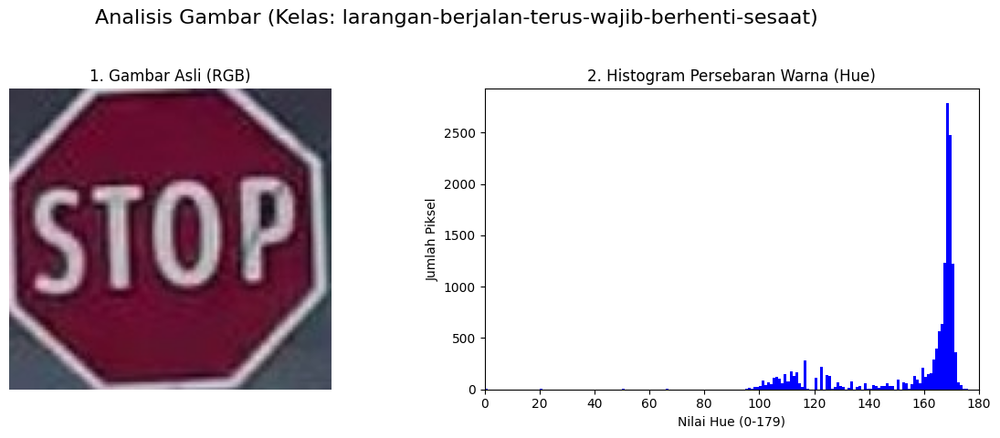

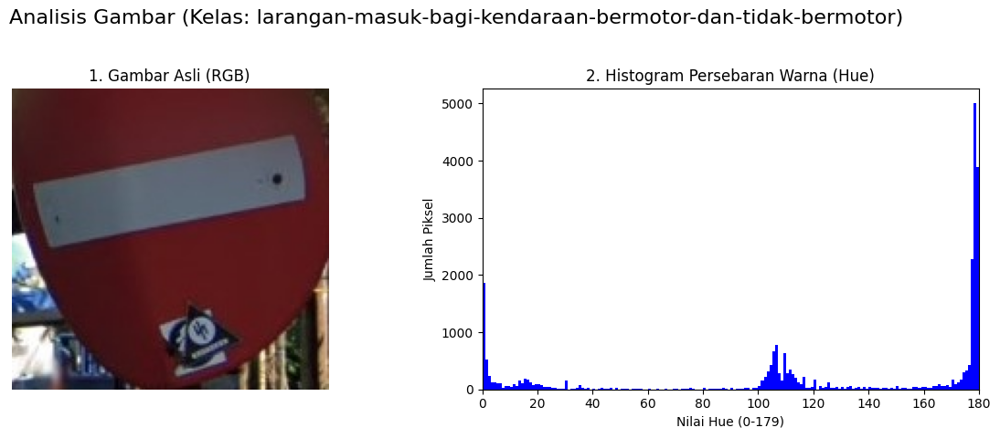

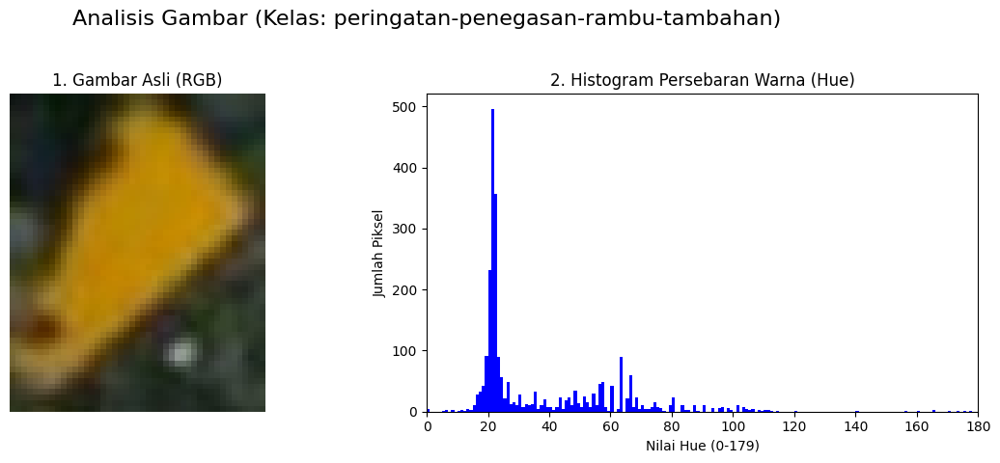

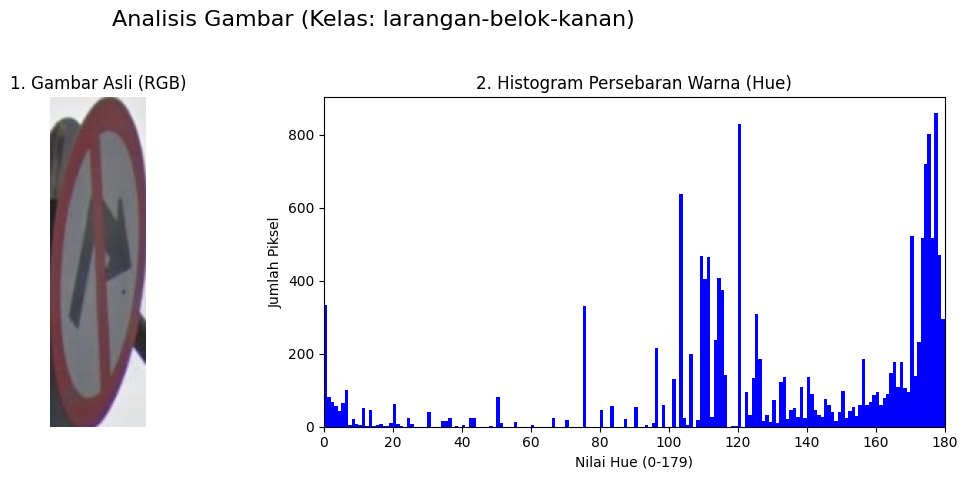

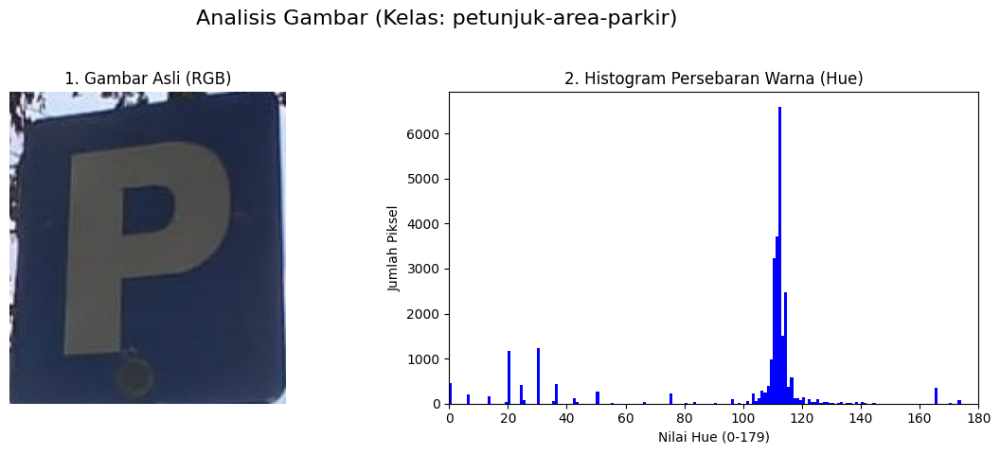

...

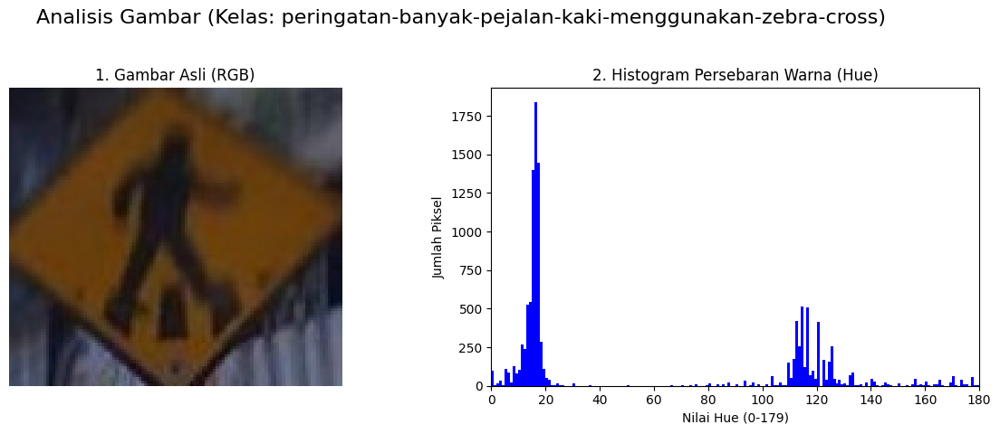

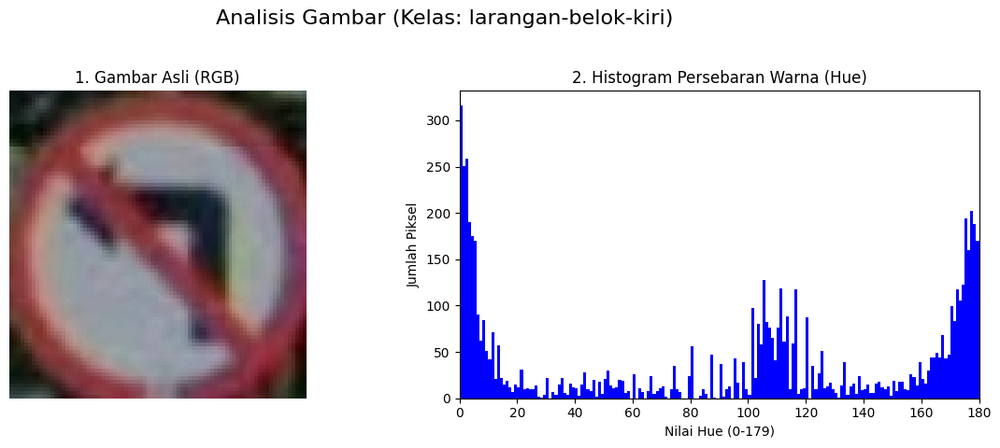

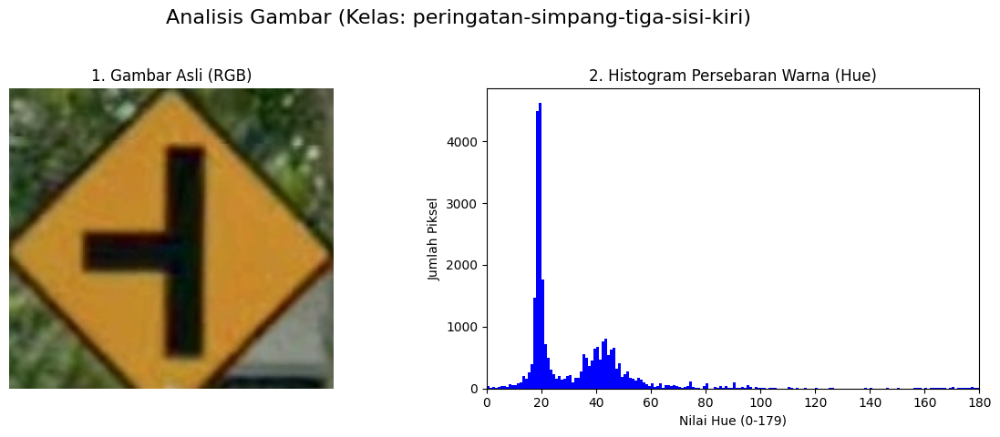

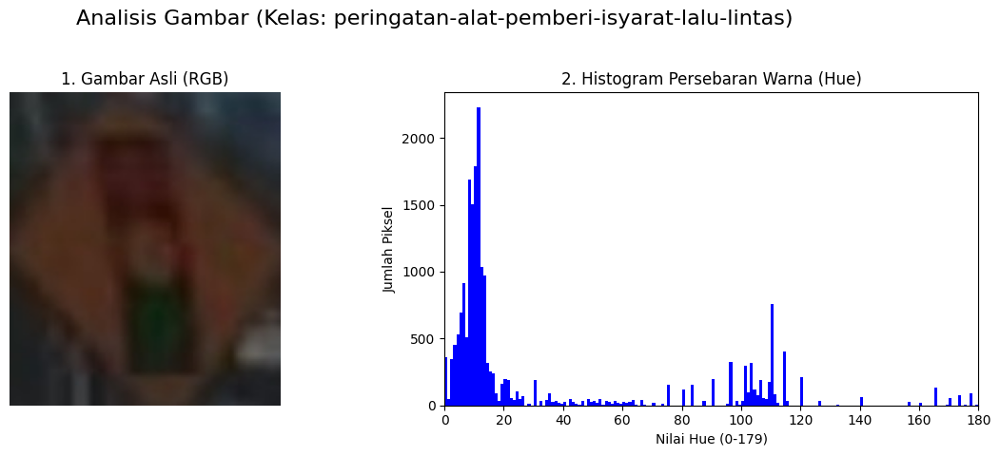

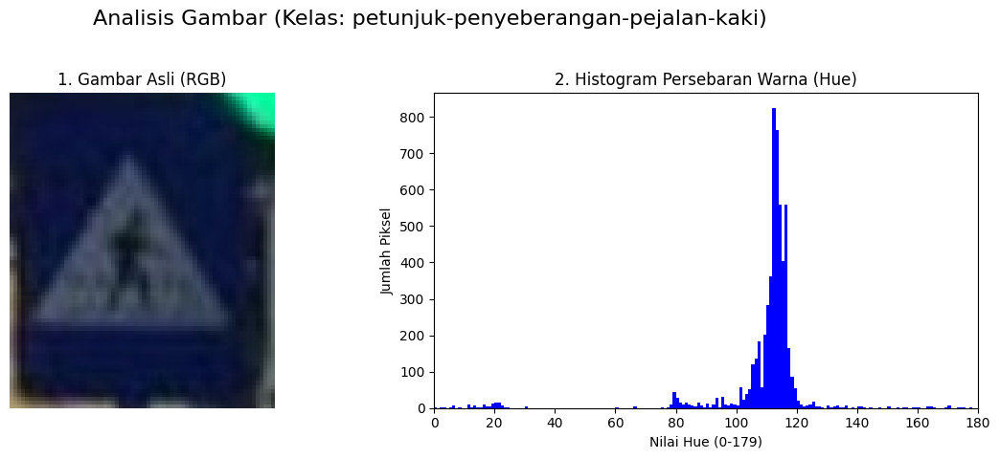

In [7]:
train_hsv = hsv_preprocessing(X_train_img, y_train_str)
test_hsv = hsv_preprocessing(X_test_img, y_test_str)

# Feature Extraction (HOG)

In [ ]:
# def get_gradients(gray_image):
#     """Menghitung magnitudo dan orientasi gradien."""
#     sobel_x = np.array([[-1, 0, 1],
#                         [-2, 0, 2],
#                         [-1, 0, 1]])

#     sobel_y = np.array([[-1, -2, -1],
#                         [ 0,  0,  0],
#                         [ 1,  2,  1]])

#     Gx = convolve2d(gray_image, sobel_x, mode='same', boundary='symm')
#     Gy = convolve2d(gray_image, sobel_y, mode='same', boundary='symm')

#     magnitude = np.sqrt(Gx**2 + Gy**2)
#     orientation_rad = np.arctan2(Gy, Gx)

#     orientation_deg = np.degrees(orientation_rad) % 180

#     return magnitude, orientation_deg

# def manual_hog_extractor(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), n_bins=9):
#     """
#     Mengimplementasikan HOG secara manual menggunakan NumPy.

#     Langkah 1: Menghitung gradien (magnitudo & orientasi).
#     Langkah 2: Membuat histogram orientasi untuk setiap 'cell'.
#     Langkah 3 & 4: Normalisasi histogram dalam 'block' yang tumpang tindih.
#     Langkah 5: Menggabungkan semua vektor blok menjadi satu vektor fitur.
#     """

#     magnitude, orientation = get_gradients(gray_image)

#     img_h, img_w = gray_image.shape
#     cell_h, cell_w = pixels_per_cell
#     block_h, block_w = cells_per_block

#     n_cells_y = img_h // cell_h
#     n_cells_x = img_w // cell_w

#     bin_size = 180.0 / n_bins

#     cell_histograms = np.zeros((n_cells_y, n_cells_x, n_bins))

#     for y in range(n_cells_y):
#         for x in range(n_cells_x):
#             cell_y_start = y * cell_h
#             cell_y_end = (y + 1) * cell_h
#             cell_x_start = x * cell_w
#             cell_x_end = (x + 1) * cell_w

#             magnitude_cell = magnitude[cell_y_start:cell_y_end, cell_x_start:cell_x_end]
#             orientation_cell = orientation[cell_y_start:cell_y_end, cell_x_start:cell_x_end]

#             hist = np.zeros(n_bins)

#             for r in range(cell_h):
#                 for c in range(cell_w):
#                     mag = magnitude_cell[r, c]
#                     ori = orientation_cell[r, c]

#                     bin_idx_float = ori / bin_size
#                     bin_1 = int(np.floor(bin_idx_float - 0.5))
#                     bin_2 = int(np.floor(bin_idx_float + 0.5))

#                     weight_2 = (bin_idx_float - (bin_1 + 0.5))
#                     weight_1 = 1.0 - weight_2

#                     hist[bin_1 % n_bins] += weight_1 * mag
#                     hist[bin_2 % n_bins] += weight_2 * mag

#             cell_histograms[y, x, :] = hist


#     n_blocks_y = n_cells_y - block_h + 1
#     n_blocks_x = n_cells_x - block_w + 1

#     all_blocks_list = []

#     epsilon = 1e-5

#     for by in range(n_blocks_y):
#         for bx in range(n_blocks_x):

#             block = cell_histograms[by : by + block_h,
#                                     bx : bx + block_w,
#                                     :]

#             block_vector = block.ravel()

#             norm = np.sqrt(np.sum(block_vector**2) + epsilon)
#             block_normalized = block_vector / norm

#             all_blocks_list.append(block_normalized)

#     final_feature_vector = np.concatenate(all_blocks_list)

#     return final_feature_vector

In [8]:
def hog_feature_extraction(img_list, class_list):
  hog_img_list = []
  cls = ""
  for i, image in enumerate(img_list):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    resized_img_bgr = cv2.resize(image, [64, 64])
    resized_img_rgb = cv2.cvtColor(resized_img_bgr, cv2.COLOR_BGR2RGB)

    gray_image = rgb2gray(resized_img_rgb)
    # hog_features = manual_hog_extractor(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), n_bins=9)
    hog_features, hog_image_visual = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)

    hog_img_list.append(hog_features)


    if cls != class_list[i]:
      cls = class_list[i]
      # _features_sk, hog_image_visual = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)

      fig, axes = plt.subplots(1, 4, figsize=(20, 5))
      fig.suptitle(f"Visualisasi Tahapan Ekstraksi Fitur {cls} ", fontsize=16)

      axes[0].imshow(image_rgb)
      axes[0].set_title(f"1. Asli (Cropped)\nBentuk: {image.shape}")
      axes[0].axis('off')

      axes[1].imshow(resized_img_rgb)
      axes[1].set_title(f"2. Resized\nBentuk: {resized_img_rgb.shape}")
      axes[1].axis('off')

      axes[2].imshow(gray_image, cmap='gray')
      axes[2].set_title(f"3. Grayscale\nBentuk: {gray_image.shape}")
      axes[2].axis('off')

      axes[3].imshow(hog_image_visual, cmap='gray')
      axes[3].set_title(f"4. Visualisasi HOG\n(Bentuk Asli: {hog_image_visual.shape})")
      axes[3].axis('off')

      plt.tight_layout(rect=[0, 0.03, 1, 0.90])
      plt.show()

  return hog_img_list

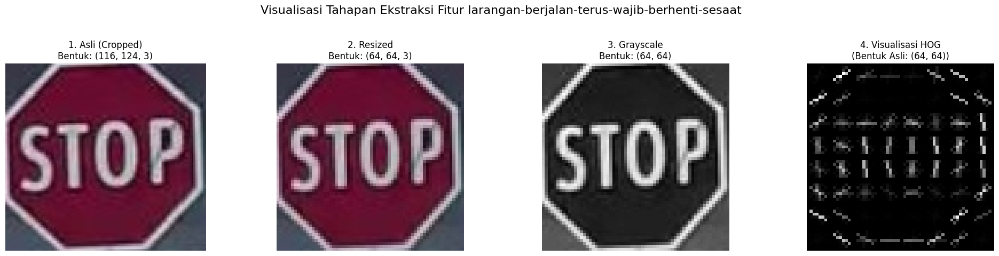

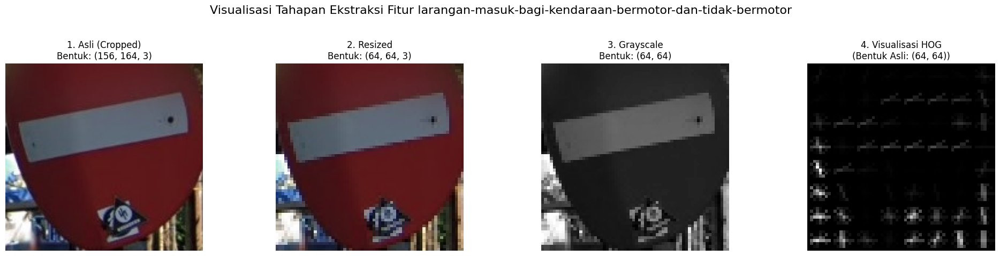

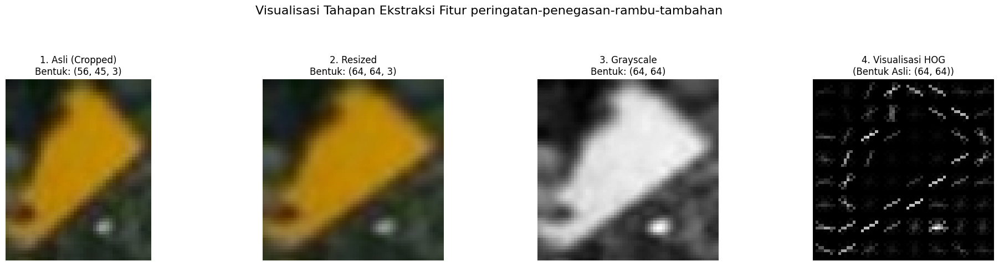

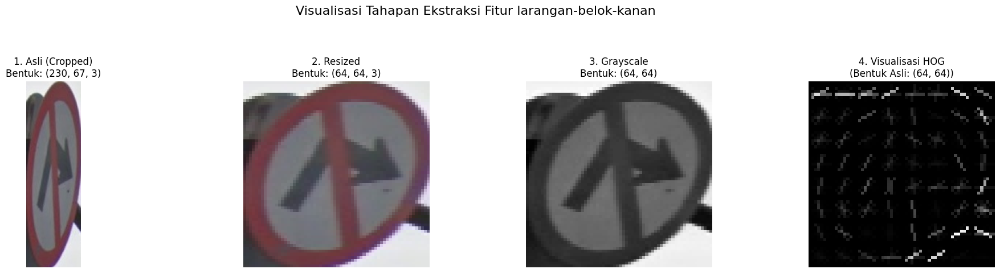

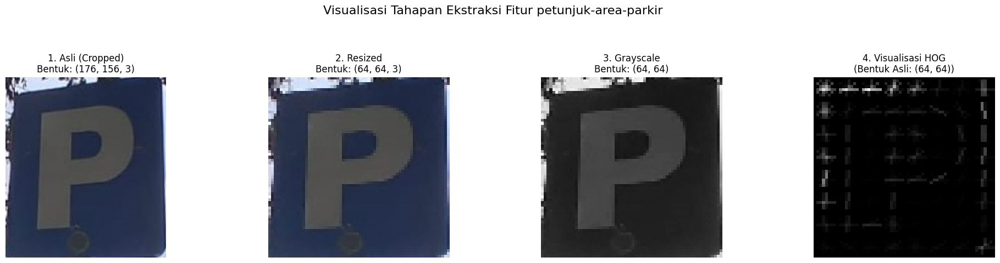

...

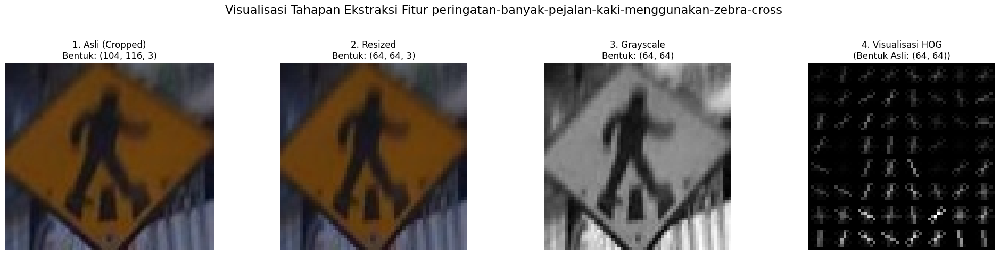

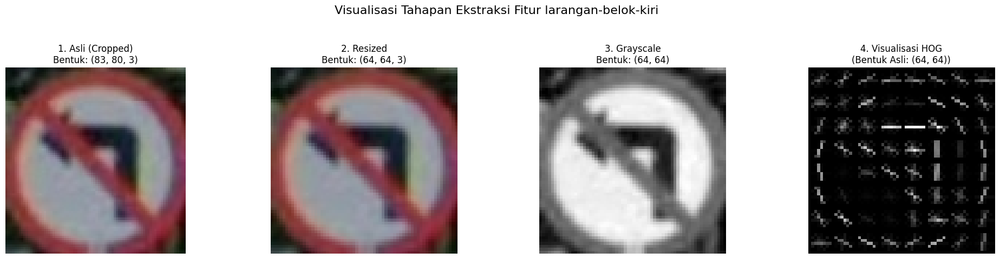

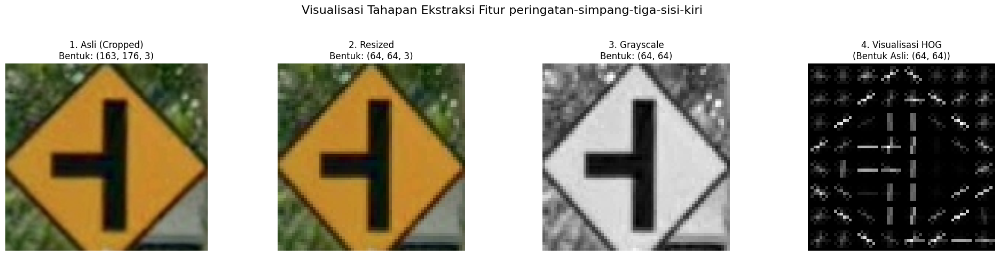

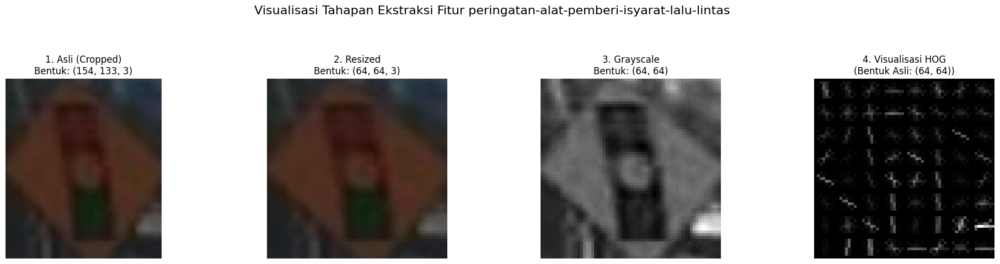

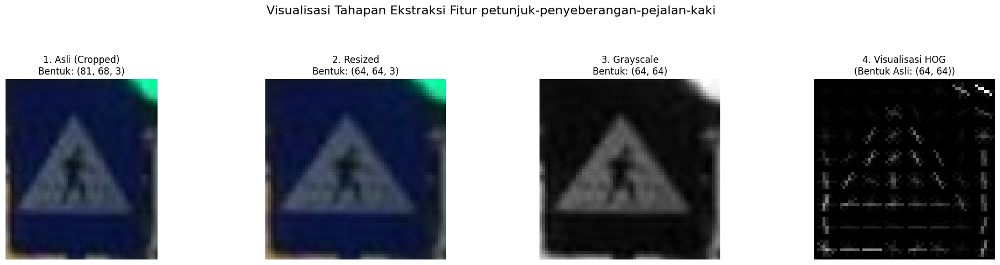

In [9]:
train_hog = hog_feature_extraction(X_train_img, y_train_str)
test_hog = hog_feature_extraction(X_test_img, y_test_str)

# Hybrid Feature

In [10]:
def hybrid_feature(hsv, hog):
  hybrid_feature_list = []
  for i in range(len(hsv)):
    hg = hog[i]
    hs = hsv[i]

    hybrid_feature_list.append(np.concatenate([hg, hs]))
  return hybrid_feature_list

In [11]:
X_train_features = hybrid_feature(train_hsv, train_hog)
X_test_features = hybrid_feature(test_hsv, test_hog)

# Label Encoding

In [12]:
list_label = [
    'lampu-hijau', 'lampu-kuning', 'lampu-merah', 'larangan-belok-kanan',
    'larangan-belok-kiri', 'larangan-berhenti',
    'larangan-berjalan-terus-wajib-berhenti-sesaat',
    'larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor',
    'larangan-memutar-balik', 'larangan-parkir',
    'peringatan-alat-pemberi-isyarat-lalu-lintas',
    'peringatan-banyak-pejalan-kaki-menggunakan-zebra-cross',
    'peringatan-penegasan-rambu-tambahan', 'peringatan-pintu-perlintasan-kereta-api',
    'peringatan-simpang-tiga-sisi-kiri', 'perintah-masuk-jalur-kiri',
    'perintah-pilihan-memasuki-salah-satu-jalur', 'petunjuk-area-parkir',
    'petunjuk-lokasi-pemberhentian-bus', 'petunjuk-lokasi-putar-balik',
    'petunjuk-penyeberangan-pejalan-kaki'
]

def label_encoder(label):
    return list_label.index(label)

In [13]:
y_train = [label_encoder(label) for label in y_train_str]
y_test = [label_encoder(label) for label in y_test_str]

# Classification (SVM) dan (RF)

In [14]:
svm_model = SVC(kernel='rbf', C=10, gamma='scale', random_state=42)

svm_model.fit(X_train_features, y_train)

SVC(C=10, random_state=42)

In [15]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

rf_model.fit(X_train_features, y_train)

RandomForestClassifier(random_state=42)

# Evalution

In [ ]:
print("Mengevaluasi model pada Test Set...")
y_pred = svm_model.predict(X_test_features)
accuracy = accuracy_score(y_test, y_pred)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test, y_pred, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 94.76%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-hijau       0.93      0.93      0.93        30
                                             lampu-kuning       0.84      0.87      0.85        30
                                              lampu-merah       0.61      0.83      0.70        30
                                     larangan-belok-kanan       1.00      1.00      1.00        30
                                      larangan-belok-kiri       1.00      1.00      1.00        30
                                        larangan-berhenti       0.97      0.97      0.97        30
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      0.93      0.97        30
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      0.87      0.9

In [16]:
print("Mengevaluasi model pada Test Set...")
y_pred = rf_model.predict(X_test_features)
accuracy = accuracy_score(y_test, y_pred)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test, y_pred, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 92.70%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-hijau       0.97      0.93      0.95        30
                                             lampu-kuning       0.83      0.83      0.83        30
                                              lampu-merah       0.62      0.80      0.70        30
                                     larangan-belok-kanan       0.94      0.97      0.95        30
                                      larangan-belok-kiri       0.97      1.00      0.98        30
                                        larangan-berhenti       1.00      0.90      0.95        30
            larangan-berjalan-terus-wajib-berhenti-sesaat       0.96      0.90      0.93        30
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       0.95      0.70      0.8

# Save Model

In [17]:
MODEL_FILENAME = "svm_traffic_sign_model.pkl"
joblib.dump(svm_model, MODEL_FILENAME)
print(f"Model telah disimpan ke: {MODEL_FILENAME}")

Model telah disimpan ke: svm_traffic_sign_model.pkl


In [18]:
MODEL_FILENAME = "rf_traffic_sign_model.pkl"
joblib.dump(svm_model, MODEL_FILENAME)
print(f"Model telah disimpan ke: {MODEL_FILENAME}")

Model telah disimpan ke: rf_traffic_sign_model.pkl
